# Script 04: Full Integration across Conditions

NB: cells were subset for myeloid, and more specifically for the affected lineages branches: monocytic & granulocytic

## Steps involved:

### i. pre-processing & HVG selection
### ii. scVI integration -> joint latent space

In [1]:
import os
import scanpy as sc
import pandas as pd
import numpy as np
import anndata as ad

In [2]:
import scvi
import torch
import seaborn as sns
import tempfile

# scvi seed (torch and numpy) and version print
scvi.settings.seed = 0
torch.set_float32_matmul_precision("high")
print("Last run with scvi-tools version:", scvi.__version__)

# plotting parameters
sc.set_figure_params(figsize=(6, 6), frameon=False)
sns.set_theme()

save_dir = tempfile.TemporaryDirectory()

%config InlineBackend.print_figure_kwargs={"facecolor": "w"}
%config InlineBackend.figure_format="retina"

/home/koellere/miniconda3/envs/scvi-tools/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Seed set to 0


Last run with scvi-tools version: 1.2.2.post2


I. functions

In [3]:
# HELPER FUNCTION: build adata from basic blocks
def build_sample_adata2(
    data_dir,
    matrix_name="matrix.mtx",
    barcodes_name="barcodes.tsv",
    features_name="features.tsv",
    cell_metadata_name="metadata.csv",
):

    # build file paths
    matrix_path = os.path.join(data_dir, matrix_name)
    barcodes_path = os.path.join(data_dir, barcodes_name)
    features_path = os.path.join(data_dir, features_name)
    cell_metadata_path = os.path.join(data_dir, cell_metadata_name)

    # read cts matrix and transpose
    adata = sc.read_mtx(matrix_path).T

    # barcodes & features
    barcodes = pd.read_csv(barcodes_path, header=None, sep="\t")[0]
    features = pd.read_csv(features_path, header=None, sep="\t")[0]

    # assign to the adata object
    adata.obs_names = barcodes
    adata.var_names = features

    # check for cell metadata
    if not os.path.exists(cell_metadata_path):
        raise FileNotFoundError(f"No cell metadata: {cell_metadata_path}")

    # read in cell meta
    cell_meta = pd.read_csv(cell_metadata_path,
                            index_col=0,
                            )

    # test indices overlap
    assert all(idx in adata.obs.index for idx in cell_meta.index)

    # merge cell meta based on indices
    adata.obs = adata.obs.join(cell_meta, how='left')

    return adata

II. read in data

In [35]:
# sample-level metadata
sample_meta = pd.read_csv("data/mice_and_batches.csv")

In [36]:
# create dictionary
mouse_to_genotype = dict(zip(sample_meta["mouse_id"], sample_meta["genotype"]))

i. aberrant conditions

In [4]:
# path to experimental conditions, annotated with scanvi predictions
treatment_dir = os.path.join("renv/results/23_FINAL_aberrant_samples_labels")

In [81]:
# loop over these objects
adatas = []
for condition in ["ko", "ko_bmt", "ei"]:

    condition_dir = os.path.join(treatment_dir, condition)

    adata = build_sample_adata2(
        data_dir=condition_dir,
        matrix_name="matrix.mtx",
        barcodes_name="barcodes.tsv",
        features_name="features.tsv",
        cell_metadata_name="metadata.csv"
    )
    adatas.append(adata)

ii. control object

In [6]:
# path to control conditions with final labels
ctrl_dir = "renv/results/21_FINAL_reference_labels"

In [82]:
# load ctrl object
adata = build_sample_adata2(
        data_dir=ctrl_dir,
        matrix_name="matrix.mtx",
        barcodes_name="barcodes.tsv",
        features_name="features.tsv",
        cell_metadata_name="metadata.csv"
)

In [83]:
adatas.append(adata)

iii. concatenate

In [85]:
# merge with anndata.concat(). CAVE: "outer" - cause some mutually exclusive metdata columns
adata = ad.concat(
    adatas, 
    axis=0,
    join="outer")

adata

AnnData object with n_obs × n_vars = 29477 × 33696
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'old_label', 'percent.mt', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'counts_outlier', 'features_outlier', 'mito_outlier', 'RNA_snn_res.0.8', 'seurat_clusters', 'scDblFinder.class', 'scDblFinder.score', 'S.Score', 'G2M.Score', 'Phase', 'mouse_id', 'batch', 'leiden_unintegrated', 'merged_mito_outlier', 'merged_counts_outlier', 'merged_features_outlier', 'leiden_harmony', 'leiden_scVI', 'leiden_scANVI', 'scanvi_predictions', 'scanvi_max_prob', 'seurat_clusters_granular', 'seurat_clusters_broad', 'cell_type'

In [86]:
del adatas

III. subset for meaningful cells

In [87]:
adata.obs["cell_type_merged"] = adata.obs["cell_type"].fillna(adata.obs["scanvi_predictions"])

In [88]:
# kill list
cell_types_to_filter = ["Neutrophils (activated)",
 "T- and NK-cells",
 "B-cell Precursors",
 "Erythroid Cells",
 "Mixed Undetermined",
 "DCs (conventional)",
 "DCs (plasmacytoid)",
 "Mast Cells",
 "Plasma Cells"]


In [89]:
adata = adata[~adata.obs["cell_type_merged"].isin(cell_types_to_filter), : ]

while at it : add unknow tag to "cell_type" we might as well run scANVI at the end after scVI:

In [91]:
adata.obs["cell_type"] = adata.obs["cell_type"].fillna("unknown")

/tmp/ipykernel_10587/3183506568.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["cell_type"] = adata.obs["cell_type"].fillna("unknown")


add genotype:

In [93]:
adata.obs["genotype"] = adata.obs["mouse_id"].map(mouse_to_genotype)

IV. pre-process & inspect

i. pre-process

In [25]:
# save raw counts
adata.layers["raw_counts"] = adata.X.copy()

In [26]:
# normalize counts
sc.pp.normalize_total(adata, 
                      target_sum=1e4, 
                      inplace=True)

In [27]:
# log+1 transform
sc.pp.log1p(adata)

In [28]:
# block HVGs by batch and by mouse_id
sc.pp.highly_variable_genes(adata, 
                            batch_key="batch", 
                            n_top_genes=3000, 
                            inplace=True)

In [29]:
# load cell cycle genes
s_genes = pd.read_csv("metadata/cell_cycle/mart_export_s.txt", header=None)[2].tolist()
g2m_genes = pd.read_csv("metadata/cell_cycle/mart_export_g2m.txt", header=None)[2].tolist()
cell_cycle_genes = set(s_genes + g2m_genes)

In [30]:
hvgs = adata.var_names[adata.var['highly_variable']]
hvgs

Index(['St18', 'Mcmdc2', 'Ppp1r42', 'Gm57177', 'Cpa6', 'Prex2', 'Gm29570',
       'Gm28095', 'Gm4956', 'Kcnq5',
       ...
       'Tlr7', 'Frmpd4', 'Arhgap6', 'Mid1', 'Kdm5d', 'Eif2s3y', 'Ddx3y',
       'Gm47283', 'mt-Nd1', 'mt-Cytb'],
      dtype='object', length=3000)

In [31]:
# remove them from HVG selection
hvgs_filtered = set(hvgs) - cell_cycle_genes
len(hvgs_filtered)

2987

In [32]:
# save em
pd.DataFrame({'highly_variable_genes': list(hvgs_filtered)}).to_csv(
    "n3000_blocked_by_batch_CCFiltered.csv", index=False
)

In [33]:
# and set these HVGs
adata.var['highly_variable'] = adata.var.index.isin(hvgs_filtered)

ii. unintegrated inspection

In [39]:
import igraph

In [40]:
sc.pp.pca(adata,
          n_comps=30,
          use_highly_variable=True)

/home/koellere/miniconda3/envs/scvi-tools/lib/python3.12/site-packages/scanpy/preprocessing/_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


In [41]:
sc.pp.neighbors(adata)

In [42]:
sc.tl.leiden(adata,
             key_added = "leiden_unintegrated")

/tmp/ipykernel_10587/3087533994.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata,


In [43]:
sc.tl.umap(adata)

In [44]:
adata.obsm['X_umap_unintegrated'] = adata.obsm['X_umap'] 

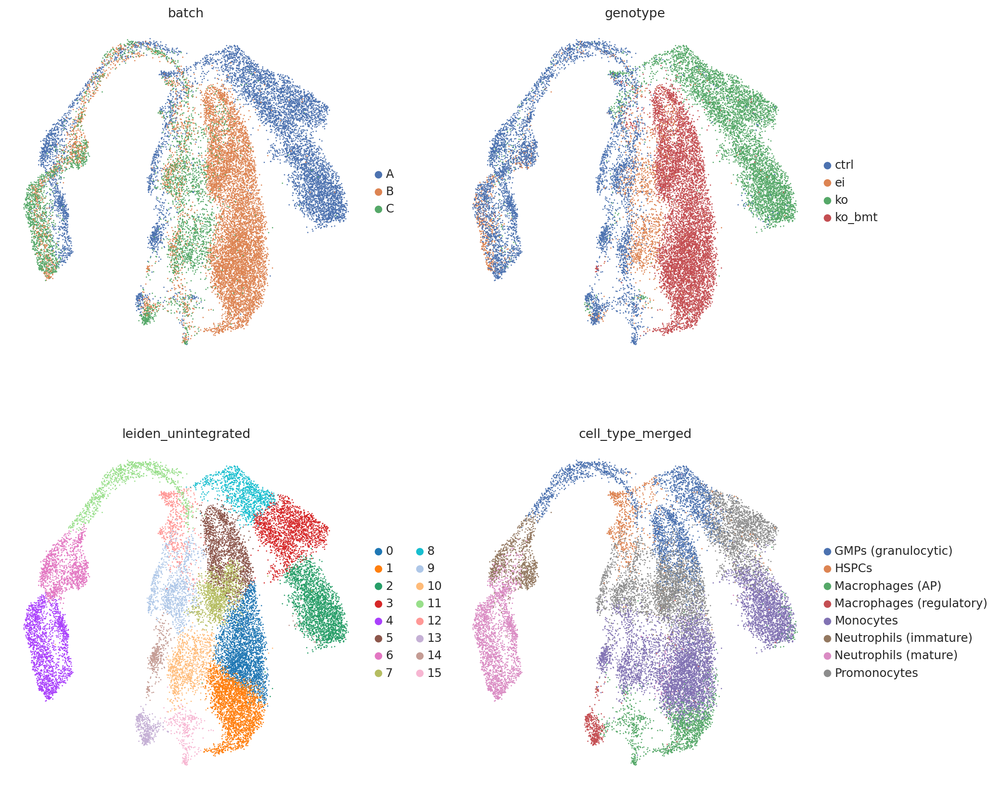

In [45]:
sc.pl.embedding(adata,
                basis = "X_umap_unintegrated",
                color = ["batch", "genotype", "leiden_unintegrated", "cell_type_merged"],
                ncols=2,
                save="_overview.png")

iii. Extract hvg subset for scVI

In [46]:
adata_vae = adata[:, adata.var["highly_variable"]].copy()
adata_vae

AnnData object with n_obs × n_vars = 21144 × 2987
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'old_label', 'percent.mt', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'counts_outlier', 'features_outlier', 'mito_outlier', 'RNA_snn_res.0.8', 'seurat_clusters', 'scDblFinder.class', 'scDblFinder.score', 'S.Score', 'G2M.Score', 'Phase', 'mouse_id', 'batch', 'leiden_unintegrated', 'merged_mito_outlier', 'merged_counts_outlier', 'merged_features_outlier', 'leiden_harmony', 'leiden_scVI', 'leiden_scANVI', 'scanvi_predictions', 'scanvi_max_prob', 'seurat_clusters_granular', 'seurat_clusters_broad', 'cell_type', 'cell_type_merged', 'genotype'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden_unintegrated', 'umap', 'batch_colors', 'genotype_colors', 'leiden_unintegrated_colors', 'cell_type_merged_colors'
    obsm: 'X_pca', 'X_umap', 'X_umap_unintegrated

In [47]:
adata_vae.layers

Layers with keys: raw_counts

In [48]:
from scipy.sparse import csr_matrix

In [49]:
# make sparse (speeds up scVI methinks)
if 'raw_counts' in adata_vae.layers:
    if not isinstance(adata_vae.layers["raw_counts"], csr_matrix):
        adata_vae.layers["raw_counts"] = csr_matrix(adata_vae.layers["raw_counts"])
        print("Converted adata_vae.layers['raw_counts'] to CSR format.")
    else:
        print("adata_vae.layers['raw_counts'] is already in CSR format.")
else:
    print("No 'raw_counts' layer found in adata_vae.")

adata_vae.layers['raw_counts'] is already in CSR format.


V. scVI integration

i. total epochs and stopping params

In [50]:
scvi_epochs = 500
early_stopping_kwargs_scvi = {
    "early_stopping": True, 
    "early_stopping_monitor": 'elbo_train',
    "early_stopping_patience": 10,
    "early_stopping_min_delta": 0.001,
}

plan_kwargs_scvi = {
    "reduce_lr_on_plateau": True,
    "lr_patience": 8,
    "lr_factor": 0.1,
}

ii. set up adata

In [51]:
# set up anndata for model training
scvi.model.SCVI.setup_anndata(adata_vae, 
                              batch_key="batch",
                              layer="raw_counts",
                              #size_factor_key="sizeFactor"
                              labels_key="cell_type"
                              )

iii. model params

In [52]:
# model paramters
scvi_model = scvi.model.SCVI(adata_vae, 
                        n_layers=2, 
                        n_latent=25, 
                        #n_hidden=128 # 128 default
                        #gene_likelihood="nb" # zinb (zero inflated NB) default
                        )

iv. train

In [53]:
scvi_model.train(
    max_epochs=scvi_epochs,
    plan_kwargs=plan_kwargs_scvi,
    check_val_every_n_epoch=1,
    **early_stopping_kwargs_scvi
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/koellere/miniconda3/envs/scvi-tools/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/home/koellere/miniconda3/envs/scvi-tools/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.
/home/koellere/miniconda3/envs/scvi-tools/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Epoch 254/500:  51%|█████     | 254/500 [08:56<08:39,  2.11s/it, v_num=1, train_loss_step=753, train_loss_epoch=760]
Monitored metric elbo_train did not improve in the last 10 records. Best score: 768.643. Signaling Trainer to stop.


VI. inspect integration

In [54]:
# get latent space
adata.obsm["X_scVI"] = scvi_model.get_latent_representation()

In [55]:
# run basic analysis
sc.pp.neighbors(adata, 
                use_rep="X_scVI")
sc.tl.leiden(adata,
             key_added="leiden_scVI")

In [56]:
# compute umap embedding
sc.tl.umap(adata)

In [57]:
adata.obsm['X_scVI_umap'] = adata.obsm['X_umap']

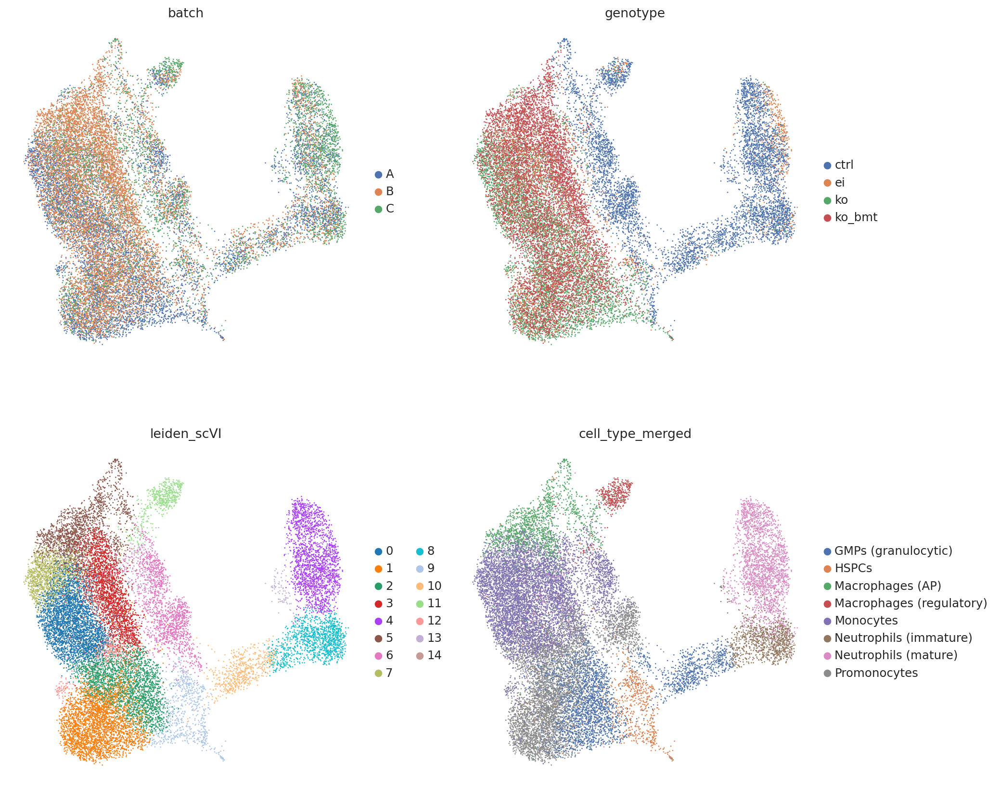

In [58]:
sc.pl.embedding(adata,
                basis = "X_scVI_umap",
                color = ["batch", "genotype", "leiden_scVI", "cell_type_merged"],
                ncols=2,
                save="_overview.png")

VII. addon: scANVI

i. early stopping params

In [59]:
scanvi_epochs = 200
early_stopping_kwargs_scanvi = {
    "early_stopping": True,
    "early_stopping_monitor": "elbo_train",
    "early_stopping_patience": 10,
    "early_stopping_min_delta": 0.001
}
plan_kwargs_scanvi = {
    "weight_decay": 0.0
}

ii. model params

In [60]:
adata_vae.obs["cell_type"].values

['unknown', 'unknown', 'unknown', 'unknown', 'unknown', ..., 'Neutrophils (mature)', 'Neutrophils (mature)', 'HSPCs', 'Macrophages (AP)', 'Neutrophils (mature)']
Length: 21144
Categories (9, object): ['GMPs (granulocytic)', 'HSPCs', 'Macrophages (AP)', 'Macrophages (regulatory)', ..., 'Neutrophils (immature)', 'Neutrophils (mature)', 'Promonocytes', 'unknown']

In [61]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(
    scvi_model,
    adata=adata_vae,
    labels_key="cell_type",
    unlabeled_category="unknown"
)

iii. train

In [62]:
scanvi_model.train(
    max_epochs=scanvi_epochs,
    check_val_every_n_epoch=1,
    plan_kwargs=plan_kwargs_scanvi,
    **early_stopping_kwargs_scanvi
)

INFO     Training for 200 epochs.                                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/koellere/miniconda3/envs/scvi-tools/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.
/home/koellere/miniconda3/envs/scvi-tools/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Epoch 11/200:   6%|▌         | 11/200 [00:54<15:42,  4.99s/it, v_num=1, train_loss_step=746, train_loss_epoch=745]
Monitored metric elbo_train did not improve in the last 10 records. Best score: 792.166. Signaling Trainer to stop.


VIII. inspect the label transfer

In [63]:
adata.obsm["X_scANVI"] = scanvi_model.get_latent_representation()

In [64]:
# run basic analysis
sc.pp.neighbors(adata, 
                use_rep="X_scANVI")
sc.tl.leiden(adata,
             key_added="leiden_scANVI")

In [65]:
# compute umap embedding
sc.tl.umap(adata)

In [66]:
adata.obsm['X_scANVI_umap'] = adata.obsm['X_umap']

In [69]:
# extract predictions
adata.obs["scanvi_predictions_full"] = scanvi_model.predict()

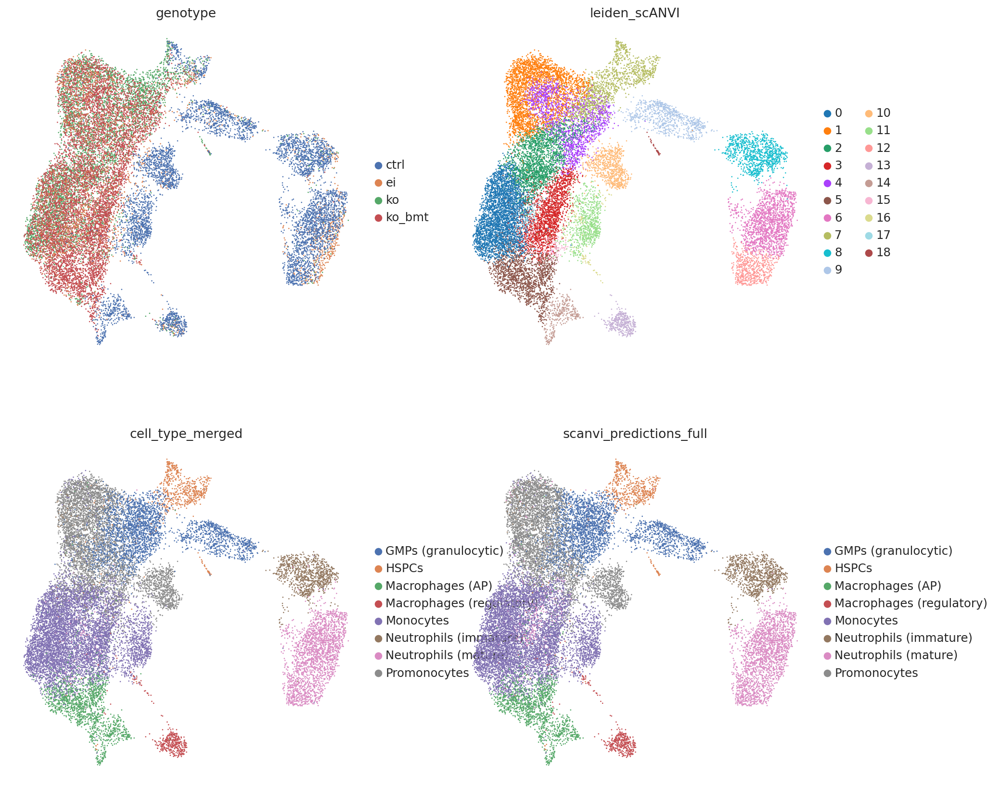

In [70]:
sc.pl.embedding(adata,
                basis = "X_scANVI_umap",
                color = ["genotype", "leiden_scANVI", "cell_type_merged", "scanvi_predictions_full"],
                ncols=2,
                save="_overview.png")

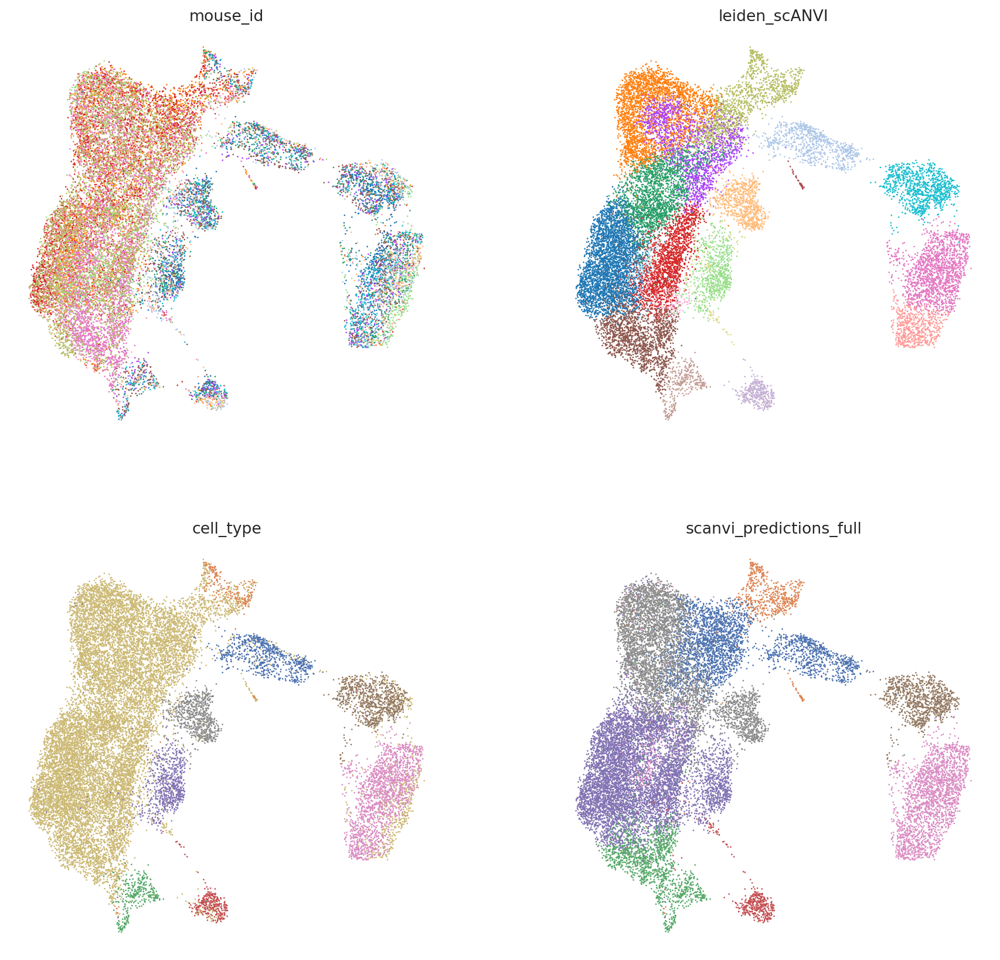

In [102]:
sc.pl.embedding(adata,
                basis = "X_scANVI_umap",
                color = ["mouse_id", "leiden_scANVI", "cell_type", "scanvi_predictions_full"],
                ncols=2,
                legend_loc = None,
                save="_overview_noLeg.png")

IX. highlight locations

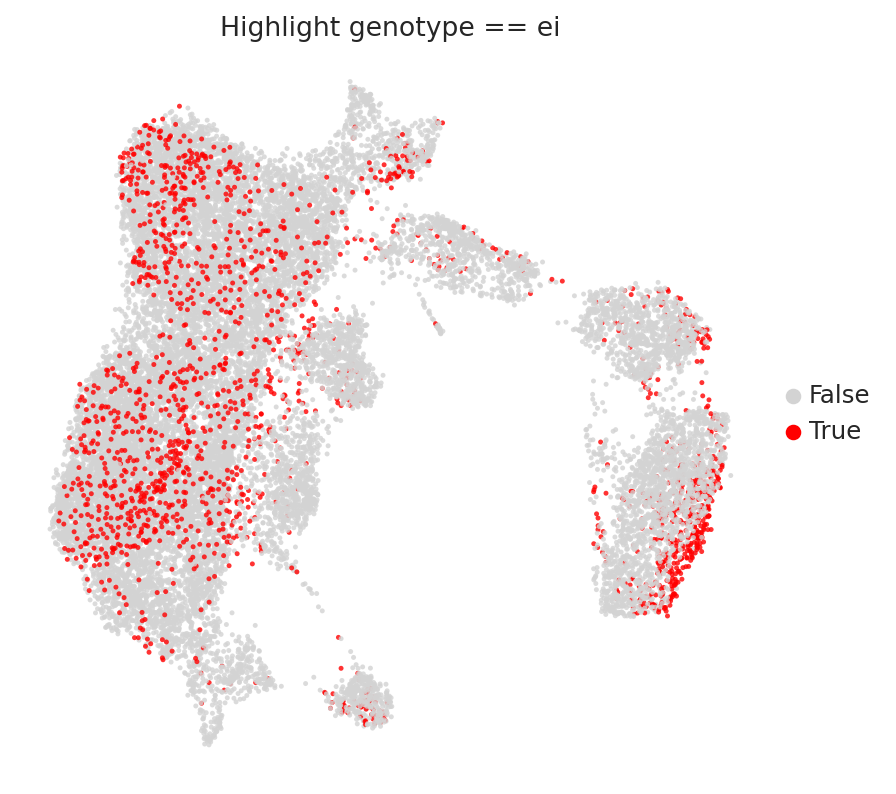

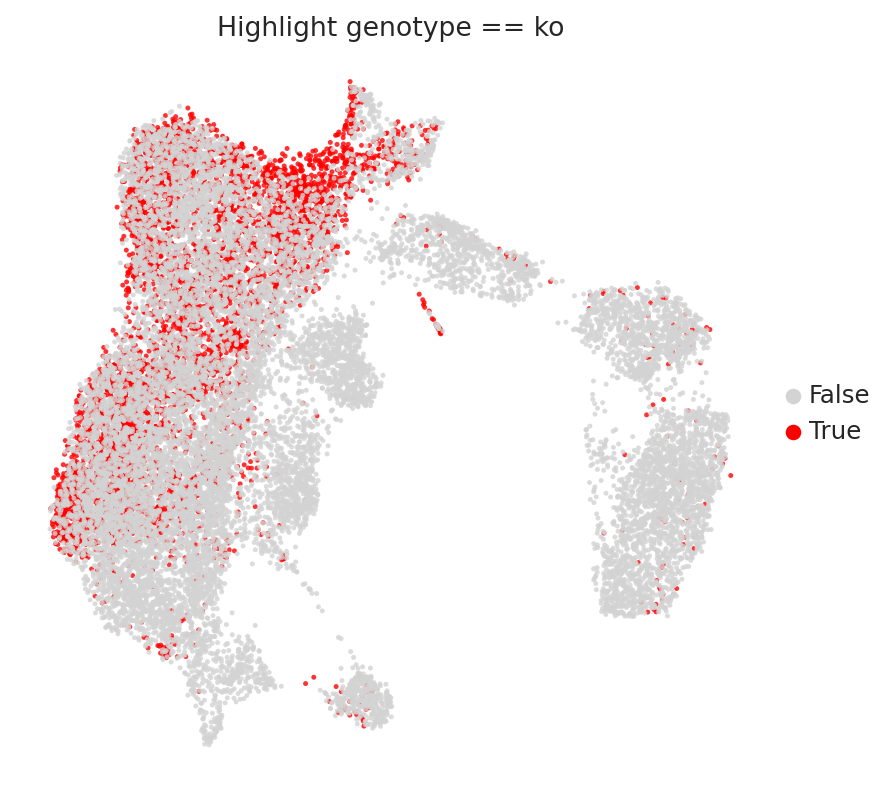

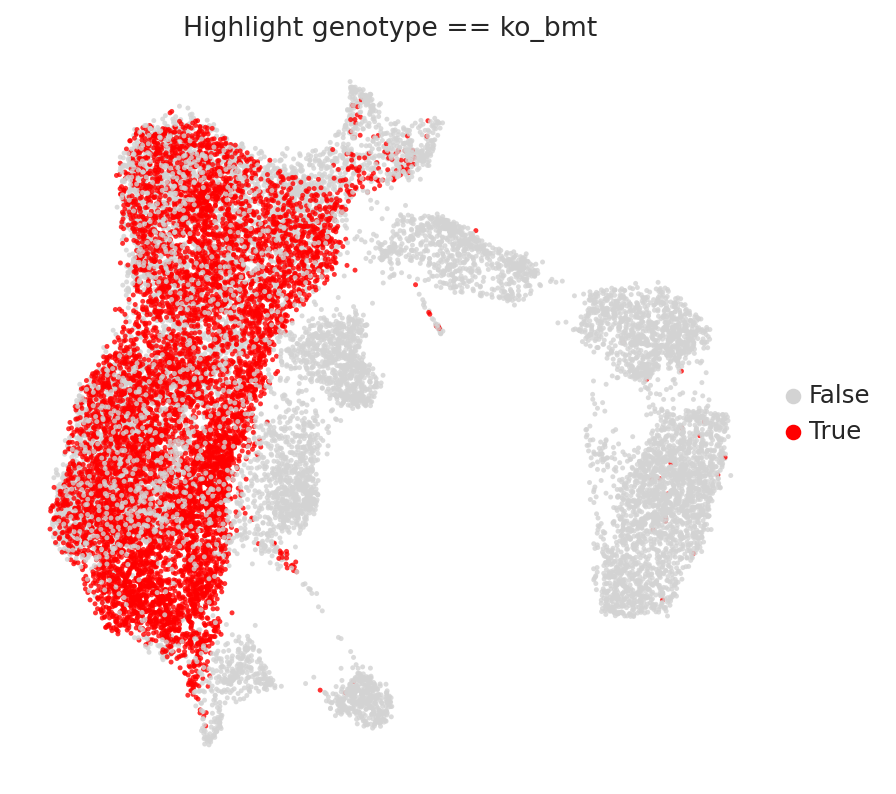

In [104]:
for genotype in ['ei', 'ko', 'ko_bmt']:
    # create highlight column
    adata.obs['highlight'] = adata.obs['genotype'] == genotype

    # plot ze umap
    sc.pl.embedding(
        adata,
        basis="X_scANVI_umap",
        color='highlight',
        palette=['lightgray', 'red'],
        title=f'Highlight genotype == {genotype}',
        size=20,
        alpha=0.8,
        save=f"_highlight_genotype_{genotype}.png"
    )

X. save stuff

In [105]:
scvi_df = pd.DataFrame(adata.obsm['X_scVI'], 
                       index=adata.obs.index)
scvi_df.to_csv('X_scVI.csv', 
               index=True)

In [106]:
scvi_umap_df = pd.DataFrame(adata.obsm['X_scVI_umap'], 
                               index=adata.obs.index)
scvi_umap_df.to_csv('X_scVI_umap.csv', 
                       index=True)

In [107]:
scanvi_df = pd.DataFrame(adata.obsm['X_scANVI'], 
                       index=adata.obs.index)
scanvi_df.to_csv('X_scANVI.csv', 
               index=True)

In [108]:
scanvi_umap_df = pd.DataFrame(adata.obsm['X_scANVI_umap'], 
                               index=adata.obs.index)
scanvi_umap_df.to_csv('X_scANVI_umap.csv', 
                       index=True)

In [109]:
unintegrated_umap_df = pd.DataFrame(adata.obsm['X_umap_unintegrated'], 
                                    index=adata.obs.index)
unintegrated_umap_df.to_csv('X_umap_unintegrated.csv', 
                            index=True)

In [110]:
prediction_df = adata.obs
prediction_df.to_csv("full_scanvi_results.csv",
               index=True)

In [111]:
prediction_df.shape

(21144, 35)